In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [67]:
from sklearn.decomposition import FastICA
from sklearn.model_selection import train_test_split
from imblearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.feature_selection import VarianceThreshold

In [43]:
frame = pd.read_csv("test.csv")
frame = frame.loc[:,frame.isnull().mean() <0.3]

In [44]:
for col in frame.columns:
    frame[col].fillna(frame[col].median(), inplace=True)

In [96]:
Y = frame.loc[:,'class']
X = frame.drop(['class'], axis=1)
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=42)

In [85]:
numeric_transformer = Pipeline(steps=[ ('scaler',MinMaxScaler()),('var',VarianceThreshold(threshold=0.90*(1-0.90))),('pca',PCA(n_components=99))])
X_train_tr = numeric_transformer.fit_transform(X_train)
X_tr = numeric_transformer.transform(X)
df_X_tr = pd.DataFrame(X_tr[:,0:10])
df_X_tr.insert(loc=0, column='class', value=Y.values)

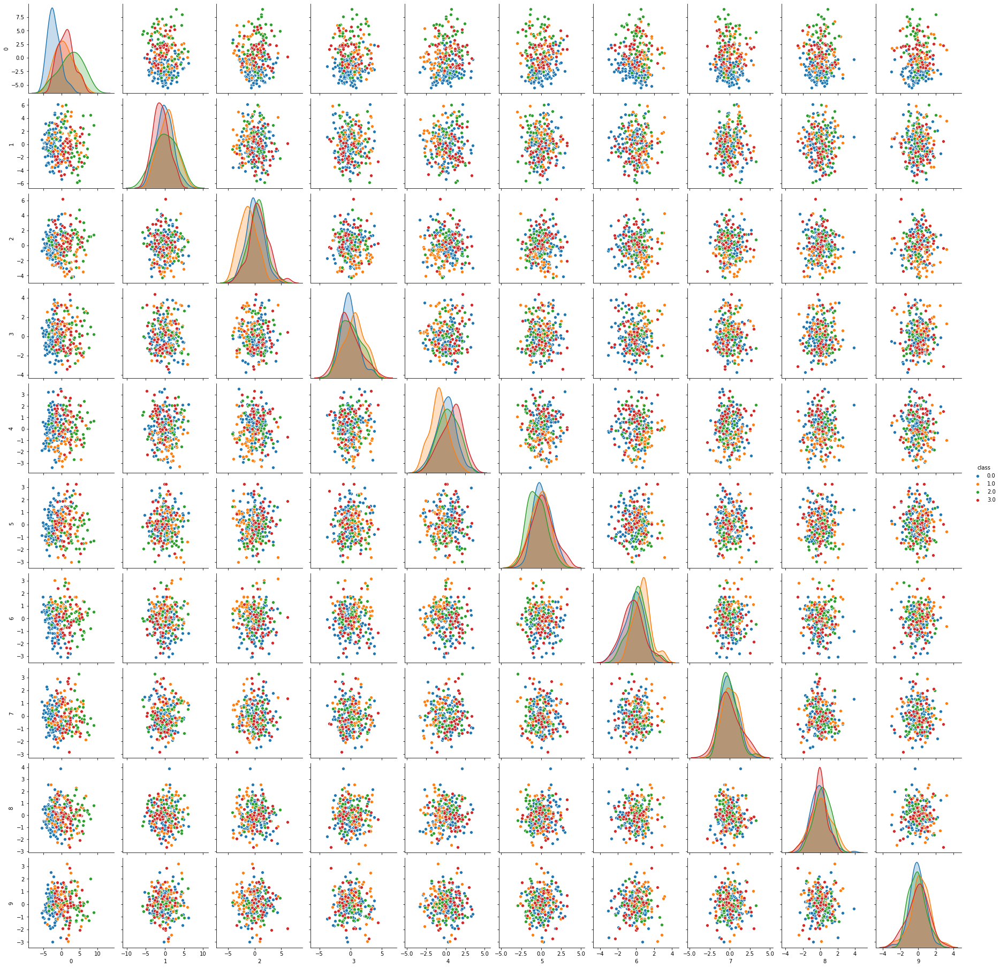

In [15]:
sns.pairplot(df_X_tr, hue='class', height=2.5) 
plt.show()

In [19]:
H_P = Y
H_P[H_P!=0] = 1
df_X_tr_H_P = pd.DataFrame(X_tr[:,0:10])
df_X_tr_H_P.insert(loc=0, column='class', value=H_P.values)

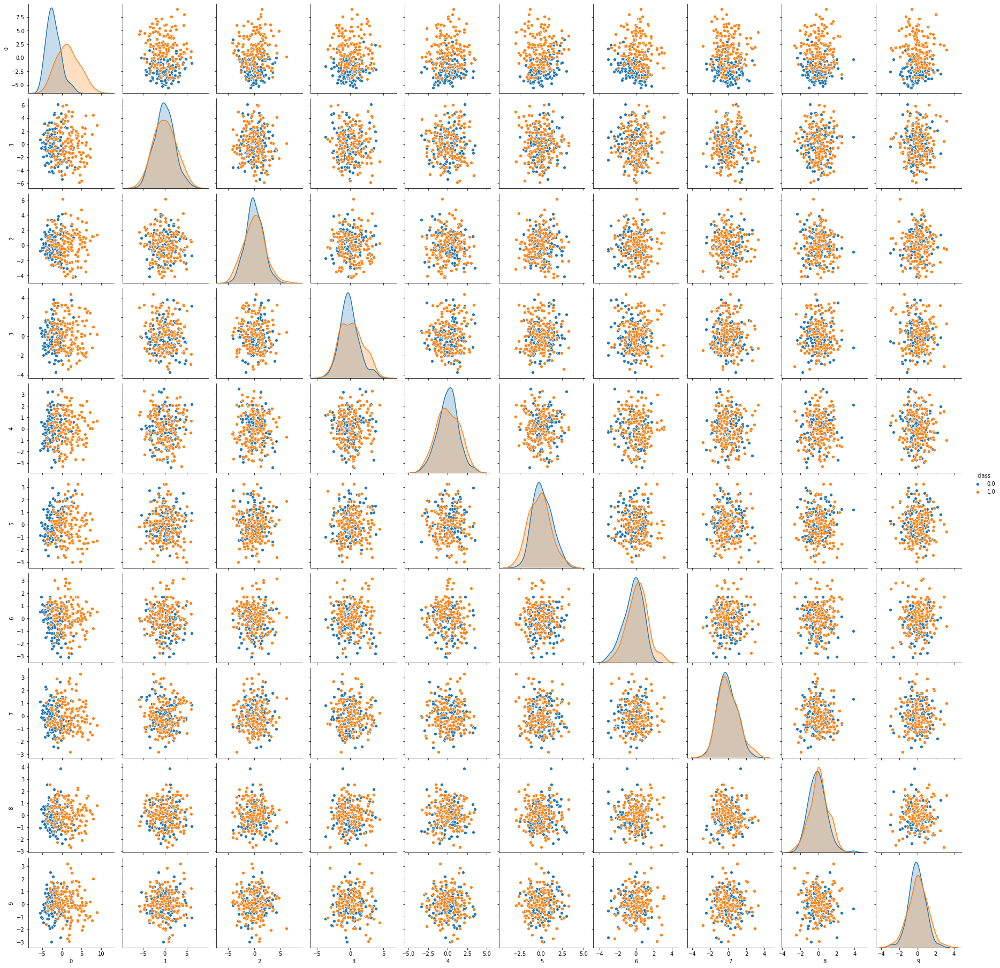

In [20]:
sns.pairplot(df_X_tr_H_P, hue='class', height=2.5) 
plt.show()

In [64]:
def plot_PCs(data,first,second,target_names):
    plt.figure()
    colors = ['turquoise', 'darkorange', 'r','b']
    lw = 2
    for color, i, target_name in zip(colors[0:len(target_names)], range(len(target_names)), target_names):
        plt.scatter(data[first][data['class']==i], data[second][data['class']==i], color=color, alpha=.8, lw=lw,
                    label=target_name)
    plt.legend(loc='best', shadow=False, scatterpoints=1)
    plt.title('PCA + Variance threshold + normalized',fontsize=15)
    plt.xlabel(str(first+1)+'PC',fontsize=15)
    plt.ylabel(str(second+1)+'PC',fontsize=15)

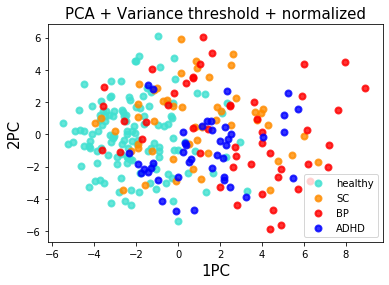

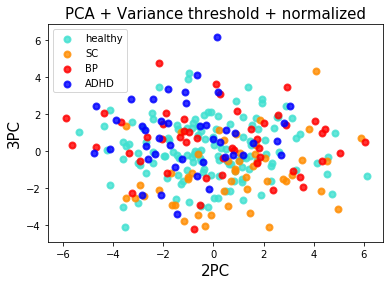

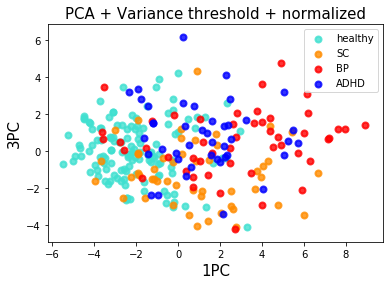

In [86]:
target_names = ['healthy', 'SC','BP','ADHD']
plot_PCs(df_X_tr,0,1,target_names)
plot_PCs(df_X_tr,1,2,target_names)
plot_PCs(df_X_tr,0,2,target_names)
plt.show()

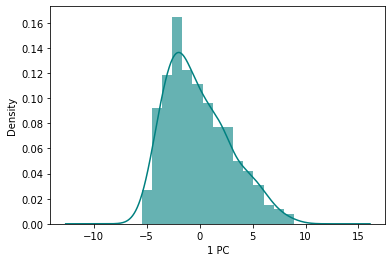

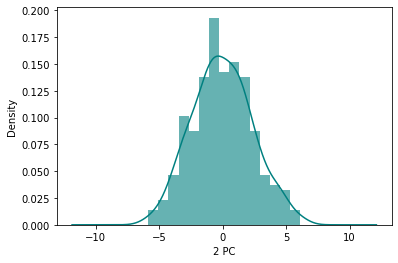

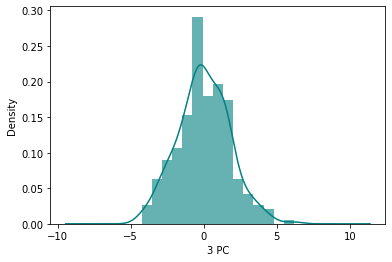

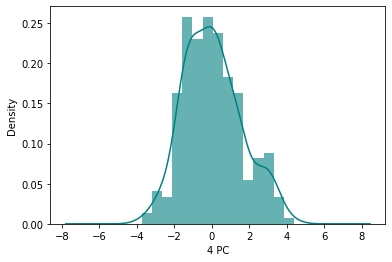

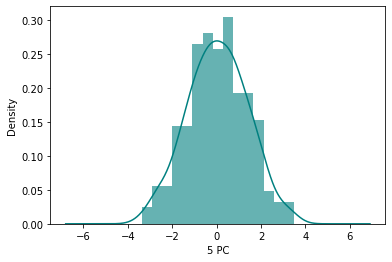

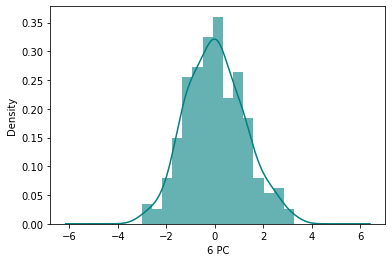

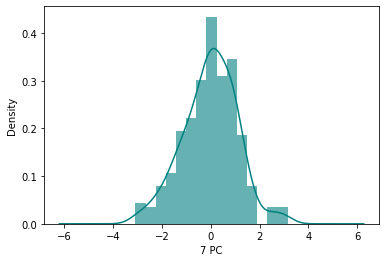

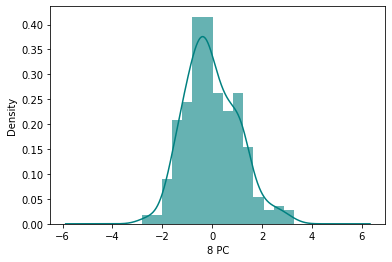

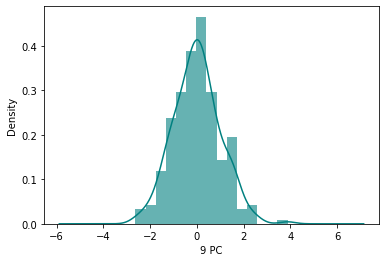

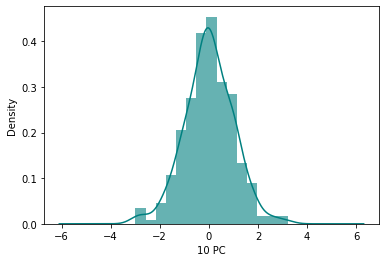

In [27]:
for i in range(10):
    ax = df_X_tr[i].hist(bins=15, density=True, stacked=True, color='teal', alpha=0.6)
    df_X_tr[i].plot(kind='density', color='teal')
    ax.set(xlabel=str(i+1) +' PC')
    #plt.xlim(-50,50)
    plt.show()

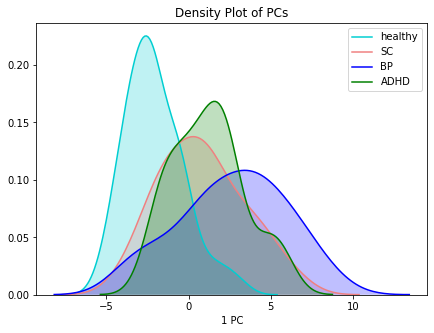

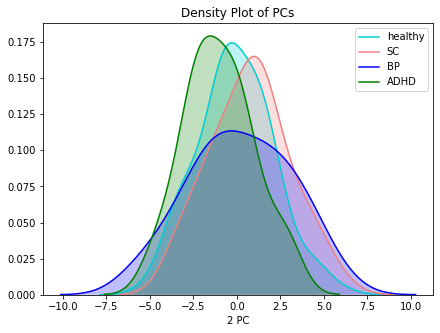

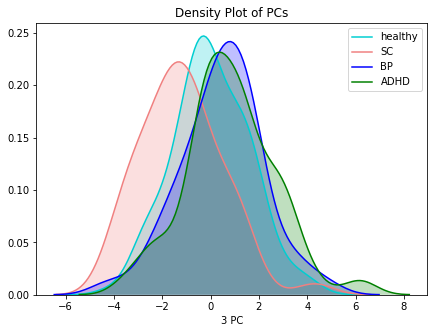

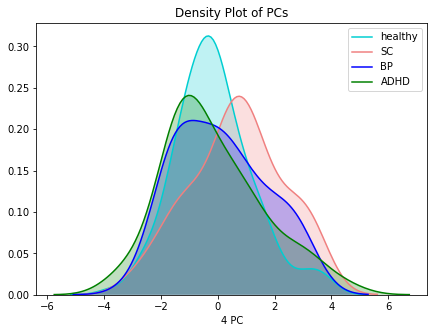

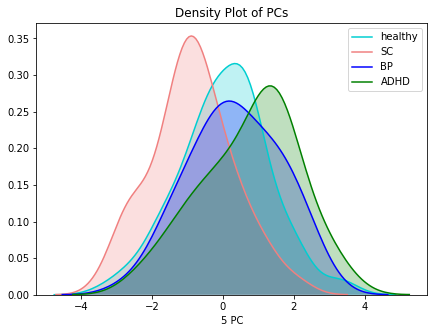

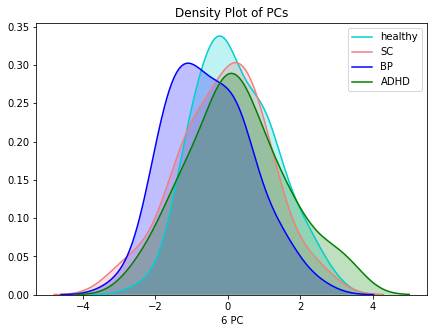

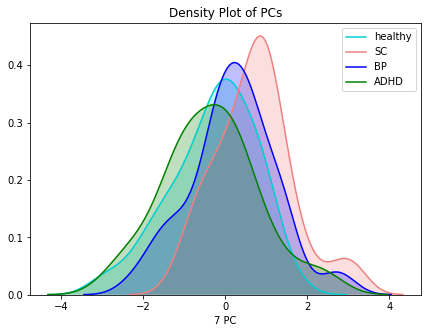

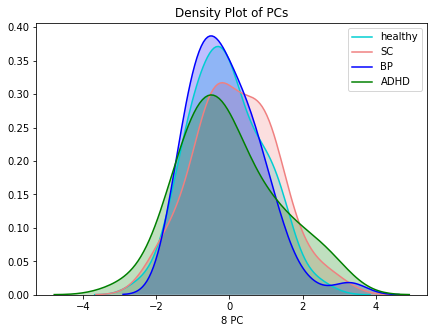

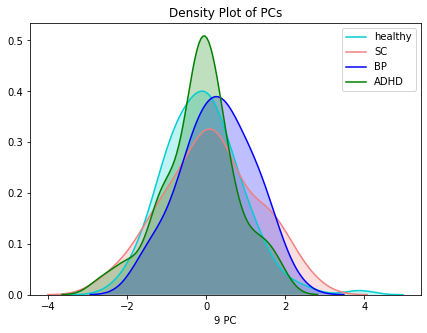

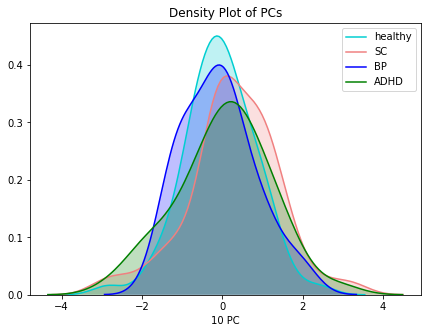

In [30]:
 for i in range(10): 
    plt.figure(figsize=(7,5))
    ax = sns.kdeplot(df_X_tr[i][df_X_tr['class'] == 0], color="darkturquoise", shade=True)
    sns.kdeplot(df_X_tr[i][df_X_tr['class'] == 1], color="lightcoral", shade=True)
    sns.kdeplot(df_X_tr[i][df_X_tr['class'] == 2], color="b", shade=True)
    sns.kdeplot(df_X_tr[i][df_X_tr['class'] == 3], color="g", shade=True)
    plt.legend(['healthy', 'SC','BP','ADHD'])
    plt.title('Density Plot of PCs')
    ax.set(xlabel=str(i+1)+' PC')
    #plt.xlim(-50,50)
    plt.show()

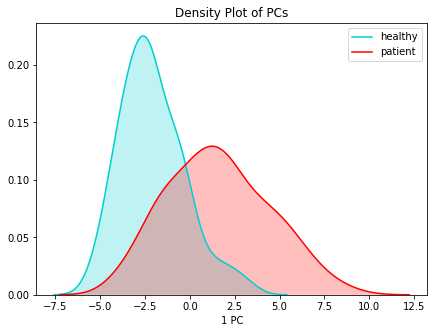

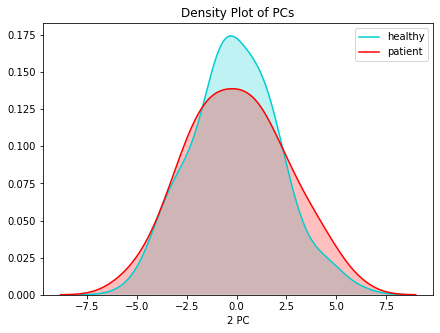

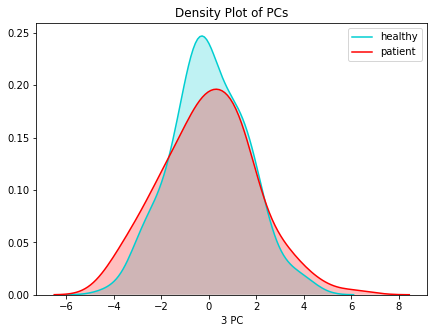

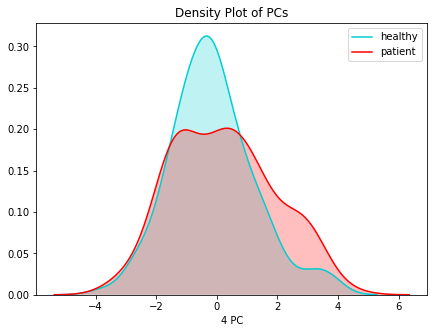

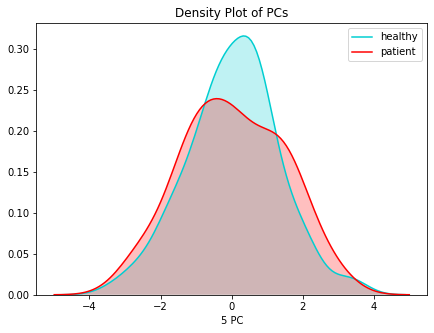

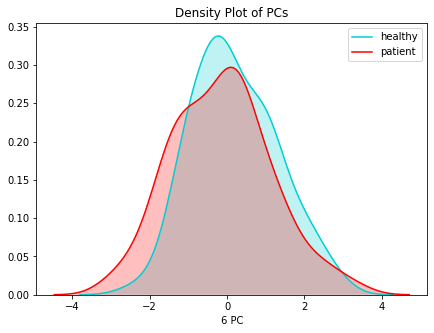

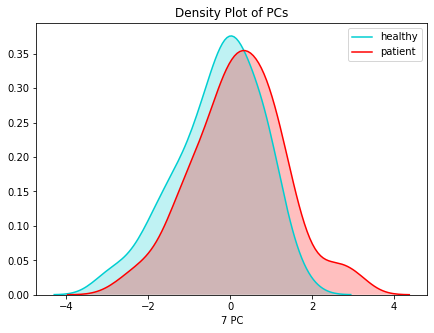

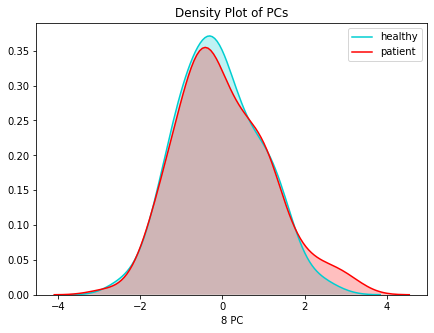

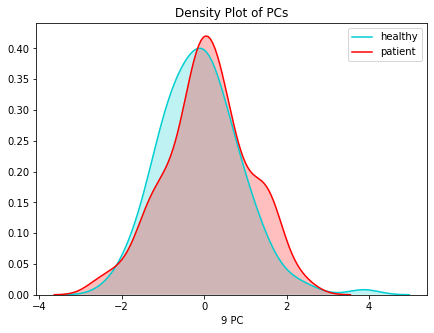

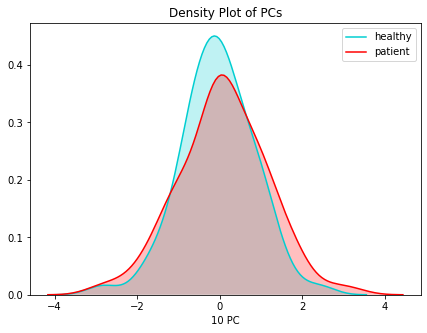

In [66]:
for i in range(10): 
    plt.figure(figsize=(7,5))
    ax = sns.kdeplot(df_X_tr[i][df_X_tr['class'] == 0], color="darkturquoise", shade=True)
    sns.kdeplot(df_X_tr[i][df_X_tr['class'] != 0], color="r", shade=True)
    plt.legend(['healthy', 'patient'])
    plt.title('Density Plot of PCs')
    ax.set(xlabel=str(i+1)+' PC')
#     if i == 0:
#         plt.xlim(-3000,3000)
    plt.show()

In [48]:
X_test_tr = numeric_transformer.transform(X_test)
df_X_test_tr = pd.DataFrame(X_test_tr[:,0:10])
df_X_test_tr.insert(loc=0, column='class', value=y_test.values)

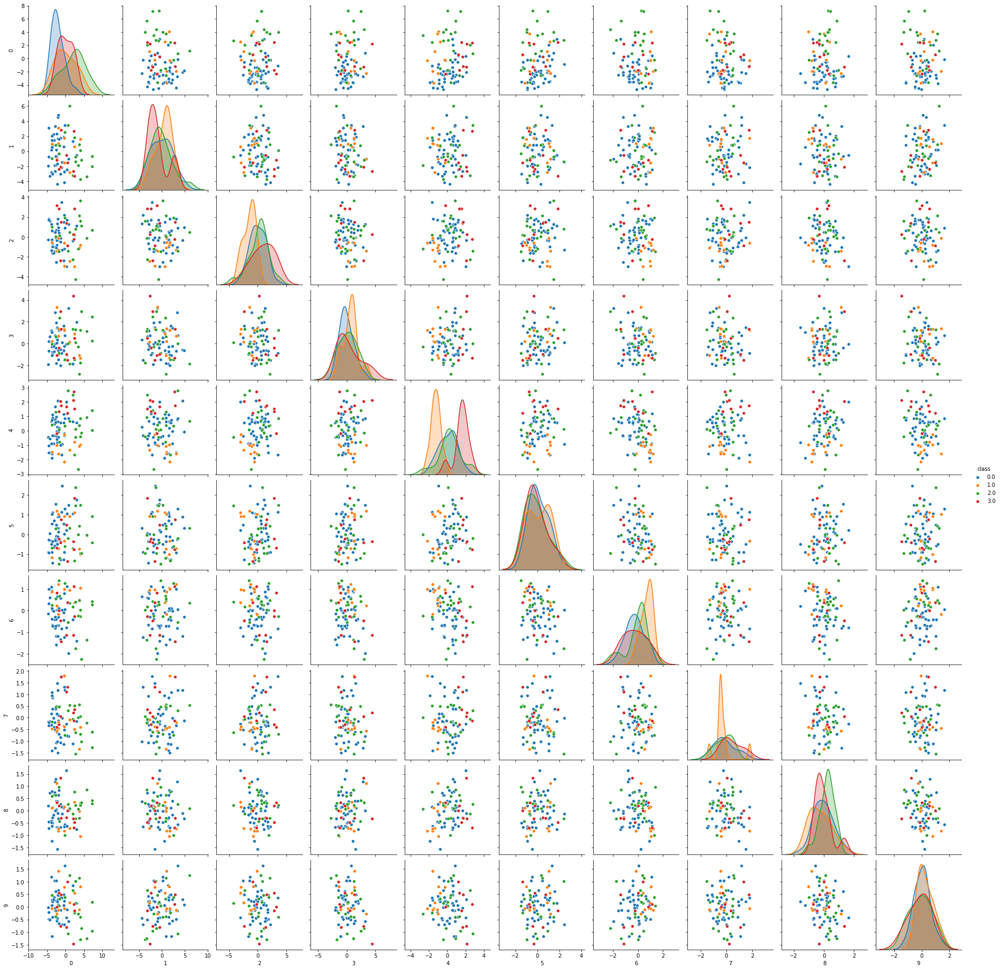

In [49]:
sns.pairplot(df_X_test_tr, hue='class', height=2.5) 
plt.show()

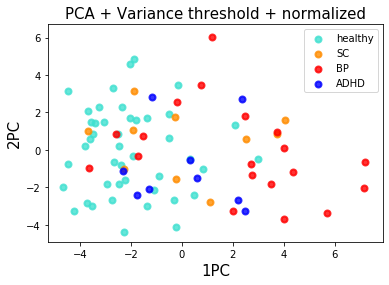

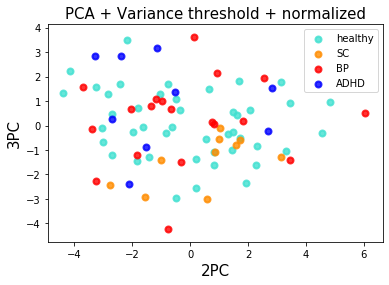

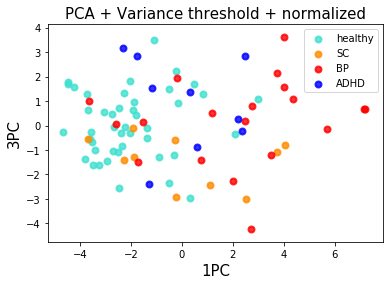

In [50]:
plot_PCs(df_X_test_tr,0,1)
plot_PCs(df_X_test_tr,1,2)
plot_PCs(df_X_test_tr,0,2)
plt.show()

In [51]:
H_P_test = y_test
H_P_test[H_P_test!=0] = 1
df_X_test_tr_H_P = pd.DataFrame(X_test_tr[:,0:10])
df_X_test_tr_H_P.insert(loc=0, column='class', value=H_P.values)

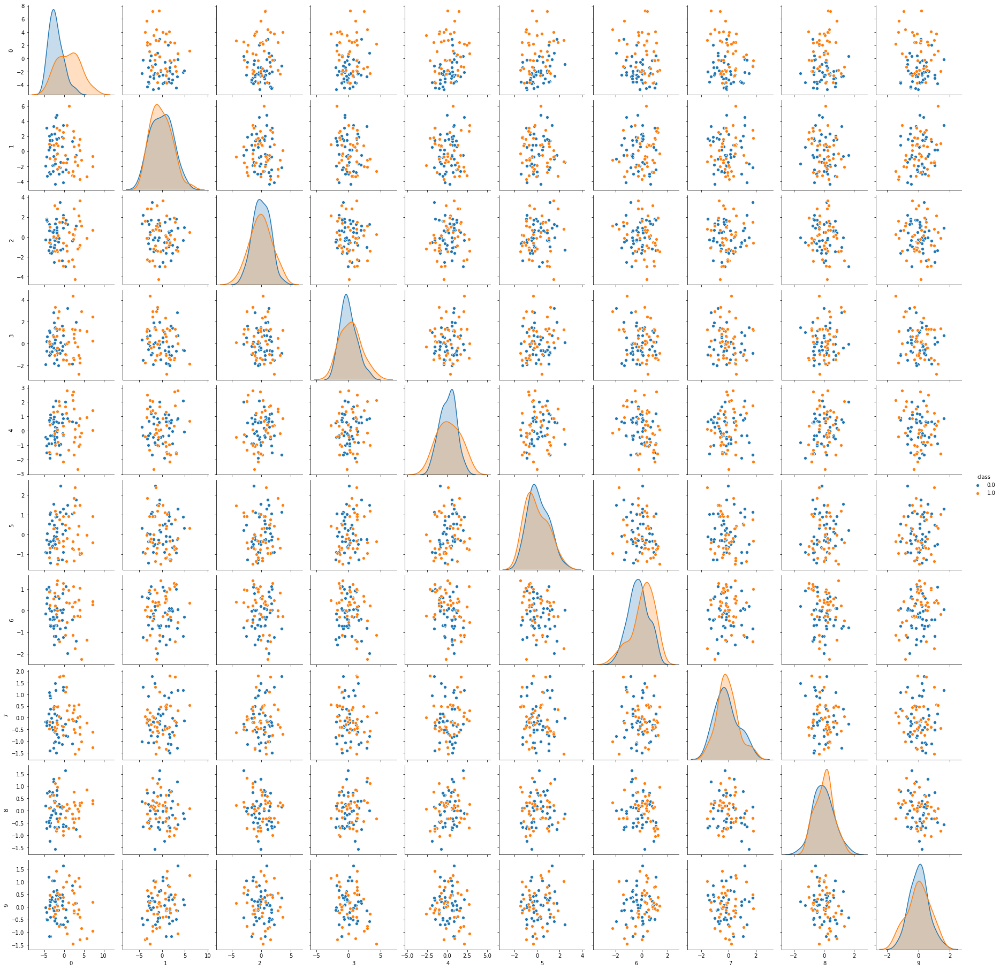

In [53]:
sns.pairplot(df_X_test_tr_H_P, hue='class', height=2.5) 
plt.show()

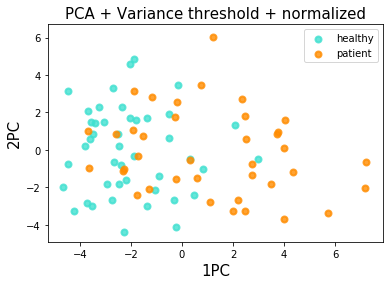

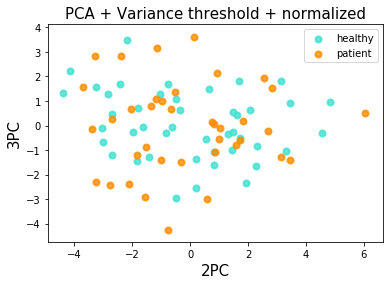

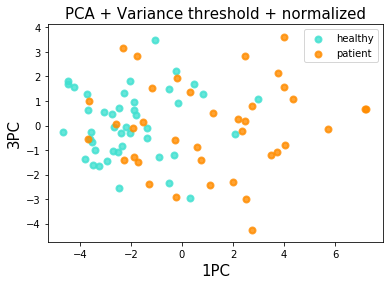

In [65]:
label = ['healthy','patient']
plot_PCs(df_X_test_tr_H_P,0,1,label)
plot_PCs(df_X_test_tr_H_P,1,2,label)
plot_PCs(df_X_test_tr_H_P,0,2,label)
plt.show()

In [73]:
numeric_transformer = Pipeline(steps=[ ('scaler',MinMaxScaler()),('lda',LinearDiscriminantAnalysis())])
X_train_tr = numeric_transformer.fit_transform(X_train,y_train)
X_tr = numeric_transformer.transform(X)

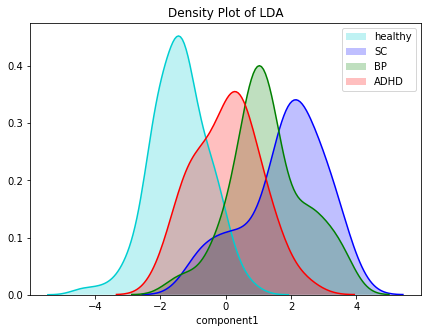

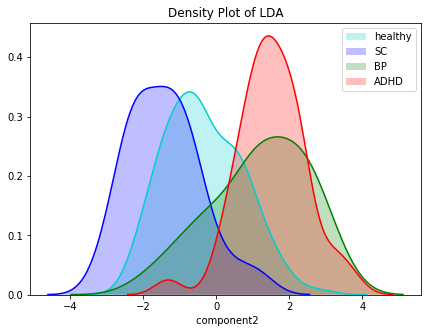

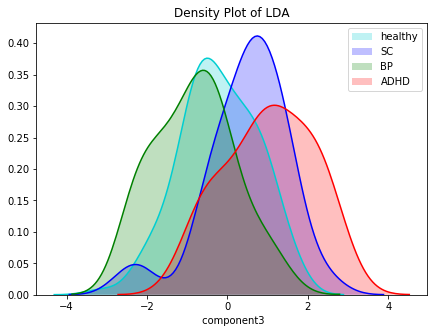

In [79]:
for i in range(3): 
    plt.figure(figsize=(7,5))
    ax = sns.kdeplot(X_tr[Y==0,i], color="darkturquoise", shade=True)
    sns.kdeplot(X_tr[Y==1,i], color="b", shade=True)
    sns.kdeplot(X_tr[Y==2,i], color="g", shade=True)
    sns.kdeplot(X_tr[Y==3,i], color="r", shade=True)
    plt.legend(['healthy', 'SC','BP','ADHD'])
    plt.title('Density Plot of LDA')
    ax.set(xlabel=' component'+str(i+1))
    plt.show()

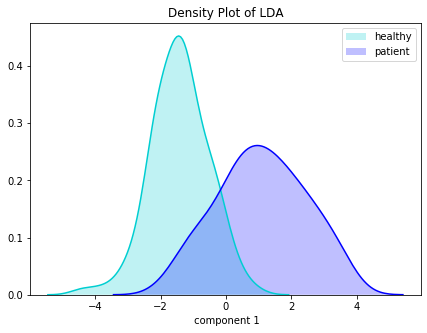

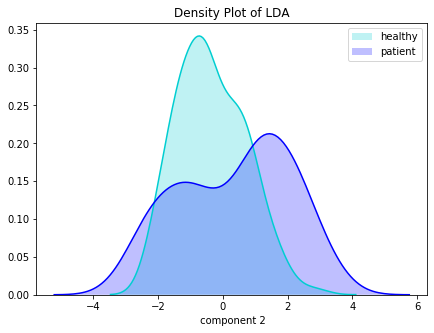

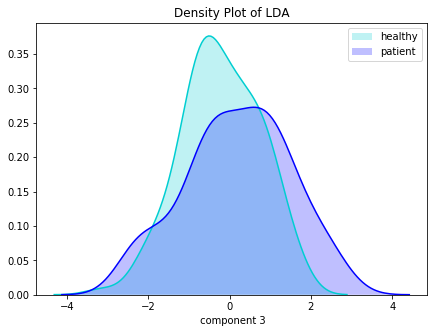

In [80]:
for i in range(3): 
    plt.figure(figsize=(7,5))
    ax = sns.kdeplot(X_tr[Y==0,i], color="darkturquoise", shade=True)
    sns.kdeplot(X_tr[Y!=0,i], color="b", shade=True)
    plt.legend(['healthy', 'patient'])
    plt.title('Density Plot of LDA')
    ax.set(xlabel=' component '+str(i+1))
    plt.show()

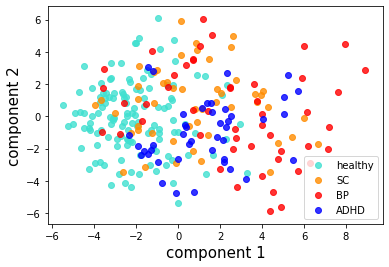

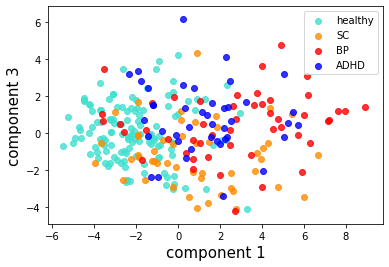

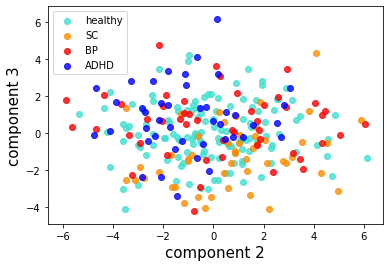

In [102]:
colors = ['turquoise', 'darkorange', 'r','b']
for j in range(3):
    for k in range(3):
        if k < j:
            for color, i, target_name in zip(colors, [0, 1,2,3], target_names):
                plt.scatter(X_tr[Y==i,k], X_tr[Y==i,j], color=color, alpha=.8,label=target_name)
                plt.legend(loc='best', shadow=False, scatterpoints=1)
                plt.xlabel('component ' + str(k+1),fontsize=15)
                plt.ylabel('component ' + str(j+1),fontsize=15)
            plt.show()

In [91]:
X_test_tr = numeric_transformer.transform(X_test)

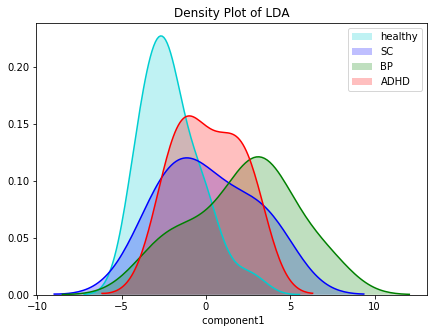

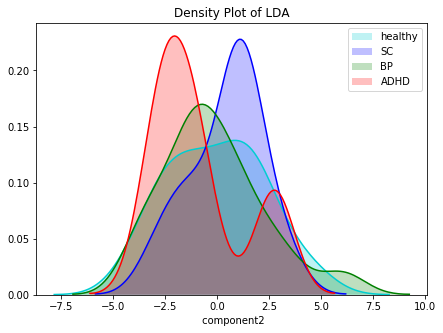

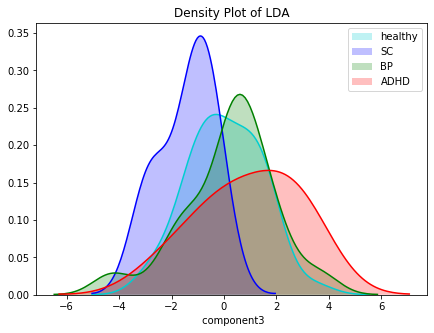

In [97]:
for i in range(3): 
    plt.figure(figsize=(7,5))
    ax = sns.kdeplot(X_test_tr[y_test==0,i], color="darkturquoise", shade=True)
    sns.kdeplot(X_test_tr[y_test==1,i], color="b", shade=True)
    sns.kdeplot(X_test_tr[y_test==2,i], color="g", shade=True)
    sns.kdeplot(X_test_tr[y_test==3,i], color="r", shade=True)
    plt.legend(['healthy', 'SC','BP','ADHD'])
    plt.title('Density Plot of LDA')
    ax.set(xlabel=' component'+str(i+1))
    plt.show()

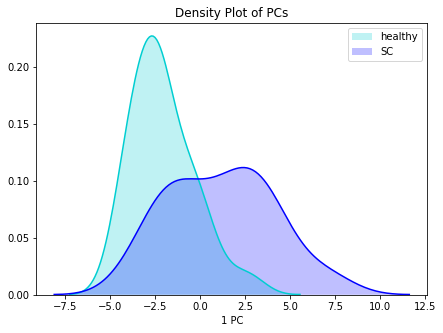

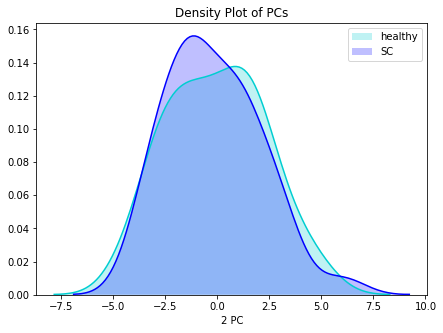

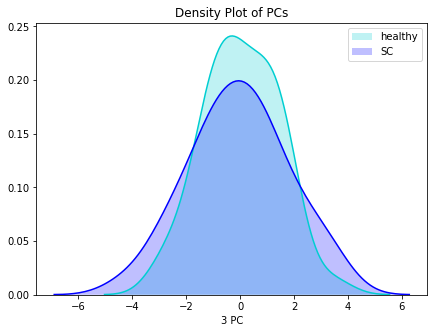

In [100]:
for i in range(3): 
    plt.figure(figsize=(7,5))
    ax = sns.kdeplot(X_test_tr[y_test==0,i], color="darkturquoise", shade=True)
    sns.kdeplot(X_test_tr[y_test!=0,i], color="b", shade=True)
    plt.legend(['healthy', 'SC','BP','ADHD'])
    plt.title('Density Plot of PCs')
    ax.set(xlabel=str(i+1)+' PC')
    plt.show()

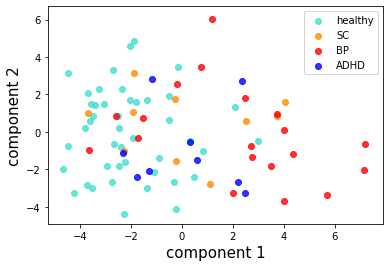

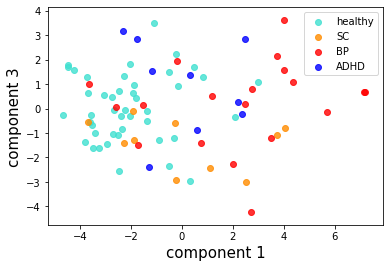

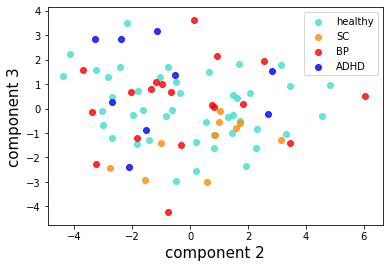

In [104]:
for j in range(3):
    for k in range(3):
        if k < j:
            for color, i, target_name in zip(colors, [0, 1,2,3], target_names):
                plt.scatter(X_test_tr[y_test==i,k], X_test_tr[y_test==i,j], color=color, alpha=.8,label=target_name)
                plt.legend(loc='best', shadow=False, scatterpoints=1)
                plt.xlabel('component ' + str(k+1),fontsize=15)
                plt.ylabel('component ' + str(j+1),fontsize=15)
            plt.show()